# Analysis of time-dependent proteome

## 1. Load data into workbook

In [62]:
import cPickle as pkl
import re
import random
import os.path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import bokeh
import collections
from statsmodels.nonparametric.smoothers_lowess import lowess

Write part of the directory listing to a variable:

In [16]:
import platform
if platform.system()=="Windows":
    files = !dir ..\..\results\volume*
else:
    files = !ls ../../results/volume*

Set up a dictionary that contains the simulation results.

In [18]:
filepaths = {}
for file in files:
    match = re.search(r'from (\w+)', file)
    if match:
        if platform.system()=="Windows":
            filepaths[int(match.group(1).zfill(4))] = r"..\\results\\" + file[file.index("volume-adjusted polyphasic"):]
            # because the output of dir is more complex than that of ls
        else:
            filepaths[int(match.group(1).zfill(4))] = file

In [19]:
print filepaths

{0: '../../results/volume-adjusted polyphasic cell cycle from 0 to 300, Teufel transcriptome, full exome, no decay, with ribo growth factor, updated initiation rates according to Shah_20170404_0842_200000_ribosomes_2100s.p', 2400: '../../results/volume-adjusted polyphasic cell cycle from 2400 to 2700, Teufel transcriptome, full exome, no decay, with ribo growth factor, updated initiation rates according to Shah_20170404_1317_286153_ribosomes_2100s.p', 3300: '../../results/volume-adjusted polyphasic cell cycle from 3300 to 3600, Teufel transcriptome, full exome, no decay, with ribo growth factor, updated initiation rates according to Shah_20170404_1501_318461_ribosomes_2100s.p', 1800: '../../results/volume-adjusted polyphasic cell cycle from 1800 to 2100, Teufel transcriptome, full exome, no decay, with ribo growth factor, updated initiation rates according to Shah_20170404_1202_264615_ribosomes_2100s.p', 300: '../../results/volume-adjusted polyphasic cell cycle from 300 to 600, Teufel 

Function to replace _numpypy.multiarray by numpy.core.multiarray. Source: http://stackoverflow.com/questions/39086/search-and-replace-a-line-in-a-file-in-python

In [20]:
from tempfile import mkstemp
from shutil import move
from os import remove, close

def replace(file_path, pattern, subst):
    #Create temp file
    fh, abs_path = mkstemp()
    with open(abs_path,'w') as new_file:
        with open(file_path) as old_file:
            for line in old_file:
                new_file.write(line.replace(pattern, subst))
    close(fh)
    #Remove original file
    remove(file_path)
    #Move new file
    move(abs_path, file_path)

Port from Pypy to Python (deactivated, takes a lot of time):

```python
for time in filepaths:
    print time,
    replace(filepaths[time], "_numpypy.multiarray", "numpy.core.multiarray")
```

In [23]:
results = {}
proteome = {}
for time in filepaths:
    print time, filepaths[time]
    results[time] = pkl.load(open(filepaths[time]))
    proteome[time] = {key: results[time]['proteome'][key] for key in results[time]['proteome'] 
                     if results[time]['proteome'][key] > 1e-1}

0 ../../results/volume-adjusted polyphasic cell cycle from 0 to 300, Teufel transcriptome, full exome, no decay, with ribo growth factor, updated initiation rates according to Shah_20170404_0842_200000_ribosomes_2100s.p
2400 ../../results/volume-adjusted polyphasic cell cycle from 2400 to 2700, Teufel transcriptome, full exome, no decay, with ribo growth factor, updated initiation rates according to Shah_20170404_1317_286153_ribosomes_2100s.p
3300 ../../results/volume-adjusted polyphasic cell cycle from 3300 to 3600, Teufel transcriptome, full exome, no decay, with ribo growth factor, updated initiation rates according to Shah_20170404_1501_318461_ribosomes_2100s.p
1800 ../../results/volume-adjusted polyphasic cell cycle from 1800 to 2100, Teufel transcriptome, full exome, no decay, with ribo growth factor, updated initiation rates according to Shah_20170404_1202_264615_ribosomes_2100s.p
300 ../../results/volume-adjusted polyphasic cell cycle from 300 to 600, Teufel transcriptome, full

## 2. Test burn-in period and steady state

We want to simulate 5 min intervals in _quasi-steady state_, so we cannot start with an empty cell; we have to allow for a burn-in period to reach steady state and discard timecourses of this period.

Plot timecourses:

In [24]:
time = 300
protnames = results[time]['timecourses'].keys()
size = 5
protnames_plot = np.array(random.sample(protnames, size*size))
protnames_plot.shape = (size, size)

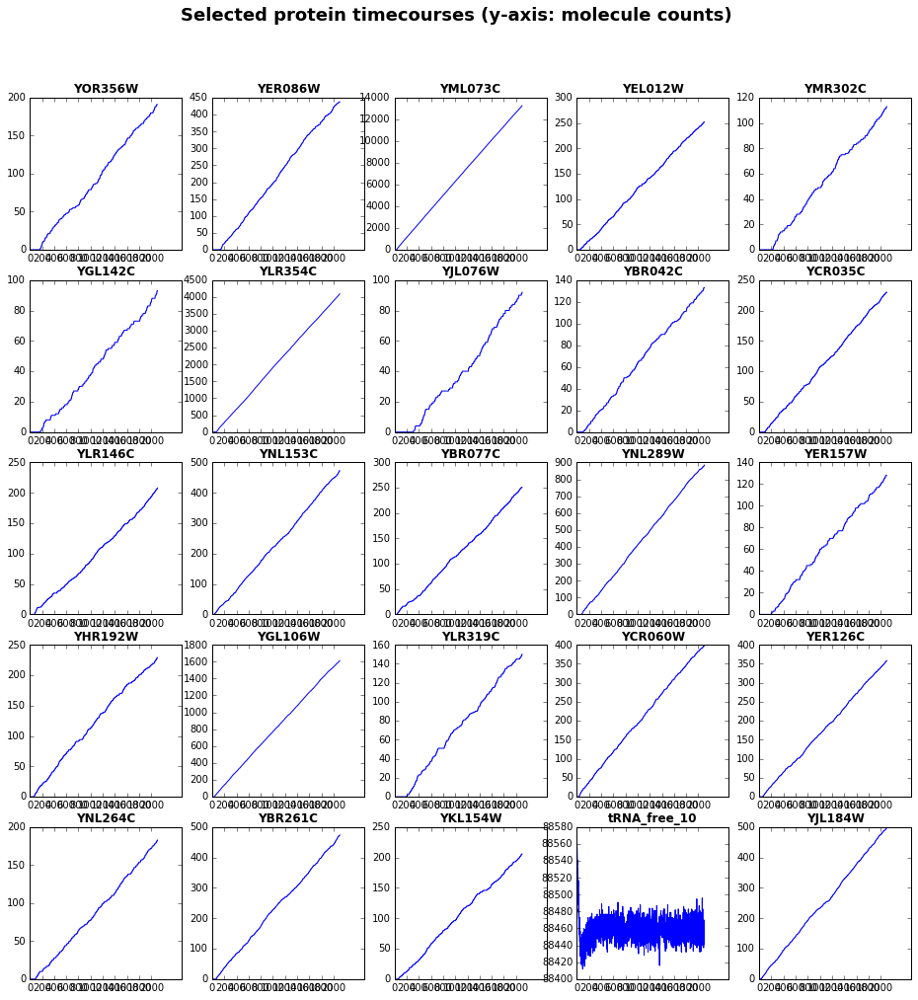

In [25]:
fig, ax = plt.subplots(size, size, figsize=(16, 16))

plt.suptitle('Selected protein timecourses (y-axis: molecule counts)', fontsize=18, fontweight='bold')

for i in range(size):
    for j in range(size):
        yseries = results[time]['timecourses'][protnames_plot[i][j]]
        xseries = np.arange(0., float(len(yseries)), 1.)
        # oddly, sometimes the simulation sometimes 'loses' one data point
        length = min(len(xseries), len(yseries))
        ax[i, j].plot(xseries[:length], yseries[:length])
        ax[i, j].set_xticks(np.arange(min(xseries), max(xseries)+1, 200.0))
        ax[i, j].set_title(protnames_plot[i][j], fontdict={'fontsize': 12, 'fontweight': 'bold'})
        ax[i, j].tick_params(axis='both', which='major', labelsize=10)


Plot increases and check for saturation of "first derivative":

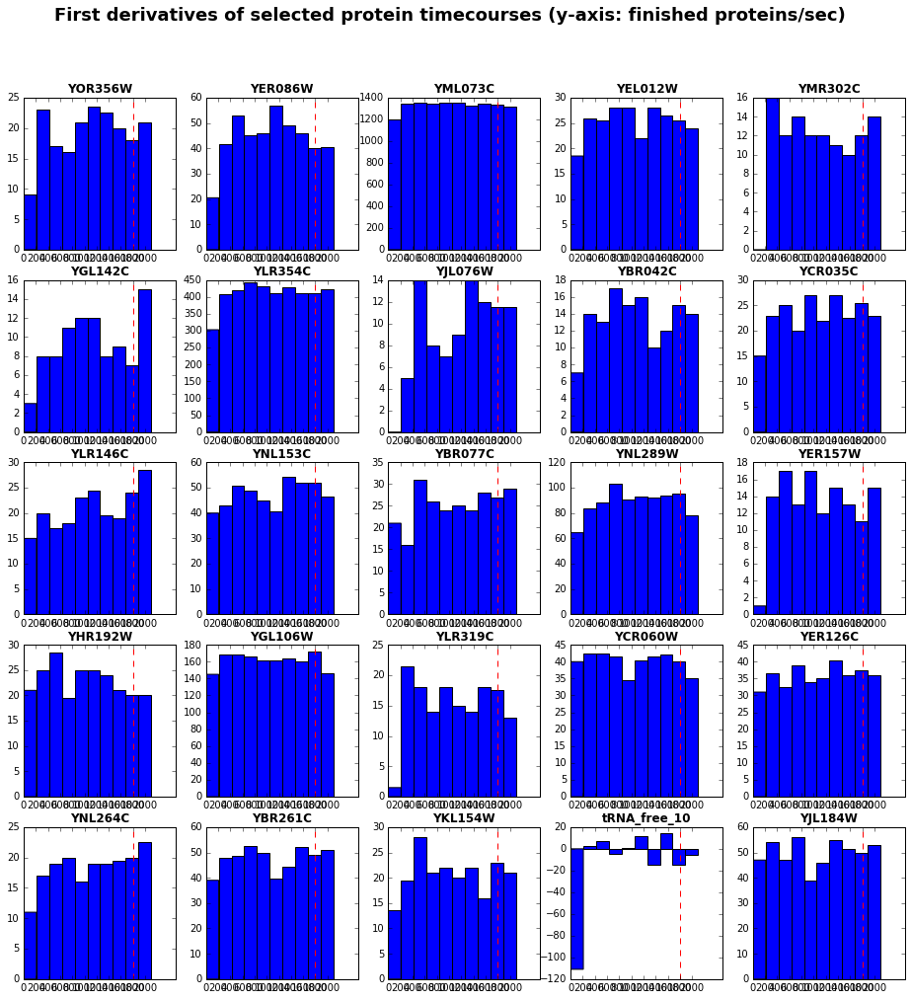

In [26]:
burnin = len(yseries) - 300  # 300 s simulation, rest is burn-in
fig, ax = plt.subplots(size, size, figsize=(16, 16))

plt.suptitle('First derivatives of selected protein timecourses (y-axis: finished proteins/sec)', fontsize=18, 
             fontweight='bold')

for i in range(size):
    for j in range(size):
        yseries = results[time]['timecourses'][protnames_plot[i][j]]
        dy = np.gradient(yseries)
        xseries = np.arange(0., float(len(dy)), 1.)
        # oddly, sometimes the simulation sometimes 'loses' one data point
        length = min(len(xseries), len(yseries))
        ax[i, j].hist(xseries, bins=10, weights=dy)
        ax[i, j].axvline(burnin, color='red', linestyle='--')
        ax[i, j].set_xticks(np.arange(min(xseries), max(xseries)+1, 200.0))
        ax[i, j].set_title(protnames_plot[i][j], fontdict={'fontsize': 12, 'fontweight': 'bold'})
        ax[i, j].tick_params(axis='both', which='major', labelsize=10)

## 3. Proteomes at different times

In [85]:
def scatter_dicts(dict1, dict2, xaxislabel=None, yaxislabel=None, fontsize=None, lws=True, logx=True, logy=True,
                 alpha=0.2):
    plotkeys = dict1.viewkeys() & dict2.viewkeys() # set intersection
    print len(plotkeys)
    xs = [dict1[key] for key in plotkeys]
    ys = [dict2[key] for key in plotkeys] 

    #ax = fig.add_subplot(111)
    ax = plt.subplot(111)
    if logx:
        ax.set_xscale('log')
    else:
        ax.set_xscale('linear')
    if logy:
        ax.set_yscale('log')
    else:
        ax.set_yscale('linear')
    ax.grid(True, linestyle = '-', color = '0.75')
    if xaxislabel:
        ax.set_xlabel(xaxislabel)
        if fontsize:
            ax.set_xlabel(xaxislabel, fontsize=fontsize)
            plt.setp(ax.get_xticklabels(), fontsize=fontsize)
    if yaxislabel:
        ax.set_ylabel(yaxislabel)
        if fontsize:
            ax.set_ylabel(yaxislabel, fontsize=fontsize)
            plt.setp(ax.get_yticklabels(), fontsize=fontsize)

    scat = plt.scatter(xs, ys)
    scat.set_alpha(alpha)
    
    # turn on lowess plot
    if lws:
        points = zip(xs, ys)
        sorted_points = sorted(points)
        new_xs = [point[0] for point in sorted_points]
        new_ys = [point[1] for point in sorted_points]
        ylowess = lowess(new_ys, new_xs)[:,1]
        plt.plot(new_xs, ylowess, 'orange', linewidth=4)

    #plt.show()

Prevent output from scrolling:

In [86]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 999;

<IPython.core.display.Javascript object>

2937


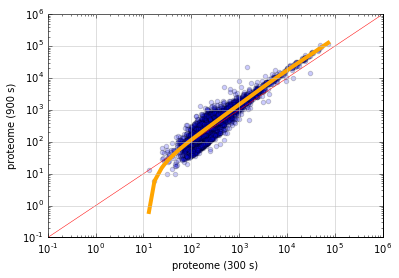

2947


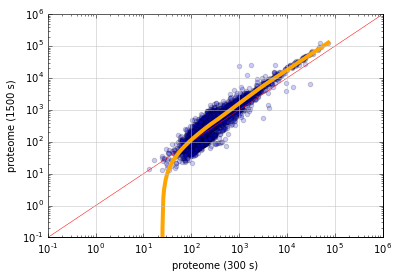

2961


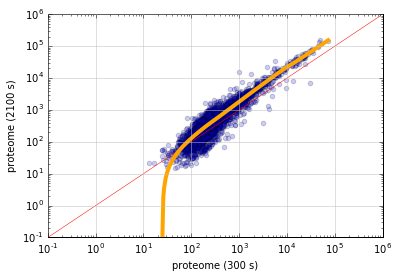

2841


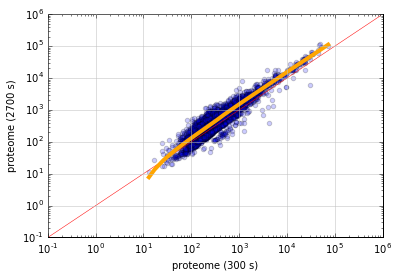

2753


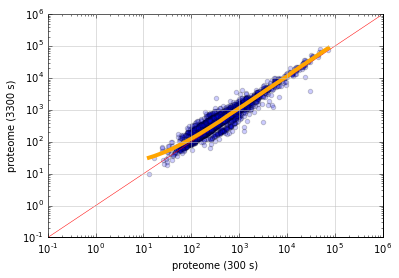

4055


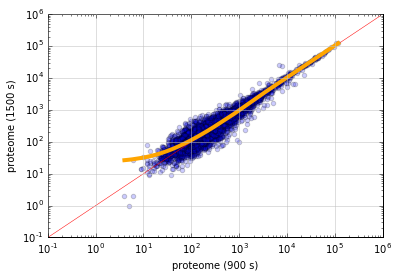

4134


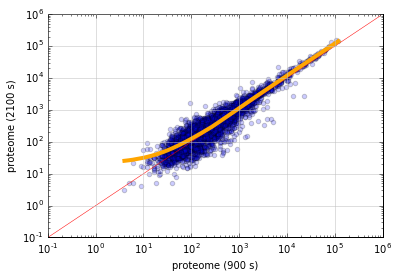

3633


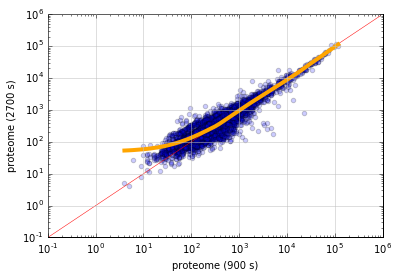

3289


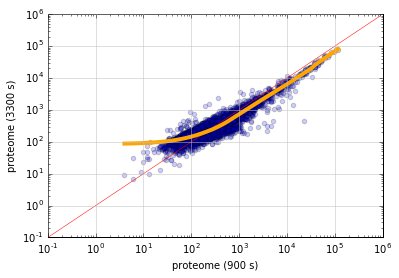

4187


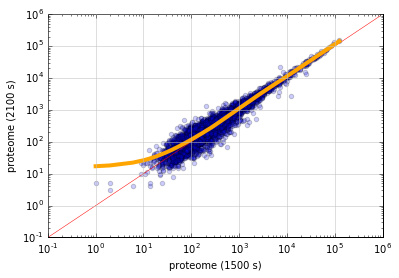

3664


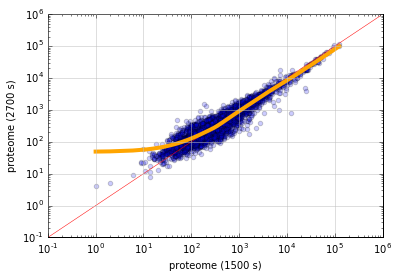

3310


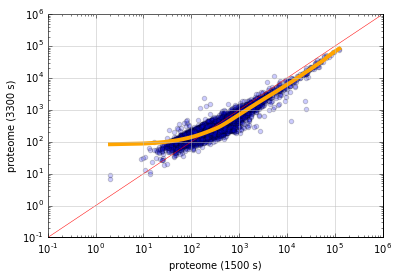

3710


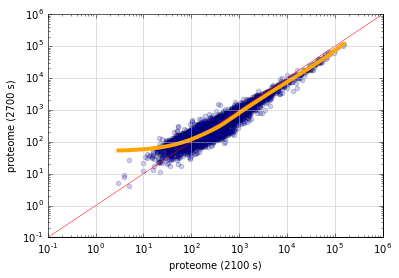

3344


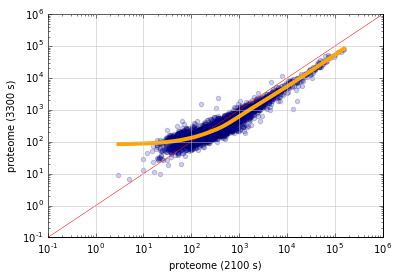

3150


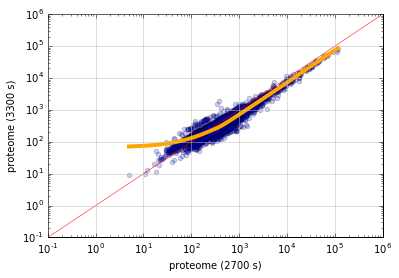

In [87]:
times = np.arange(0, 3600, 600) #[:4]
#rows = len(times/columns)
for i, tx in enumerate(times):
    #fig, ax = plt.subplots(rows, columns, figsize=(16, 16))
    for ty in times[i+1:]:
        fig =  plt.figure()                
        plt.plot([1e-1, 1e6-100000], [1e-1, 1e6-100000], color='red', linestyle='-', linewidth=0.5)
        scatter_dicts(proteome[tx], proteome[ty], xaxislabel="proteome ({} s)".format(tx+300), 
                      yaxislabel="proteome ({} s)".format(ty+300), fontsize=None)
        plt.show()

## 4. Translational impact (fold-changes transcriptome vs proteome)

Get mRNAs:

In [31]:
transcriptomes_dict = collections.OrderedDict(sorted(
        pkl.load((open('../../parameters/transcriptome_time_dependent.p'))).items()))

In [32]:
transcriptomes_dict.keys()

[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]

In [40]:
absolute_transcript_count = collections.OrderedDict([(time, sum(transcriptomes_dict[time].values())) 
                                                     for time in sorted(transcriptomes_dict.keys())])

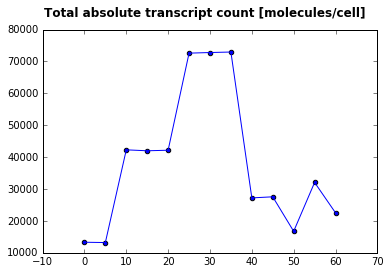

In [41]:
plt.suptitle('Total absolute transcript count [molecules/cell]', fontsize=12, 
             fontweight='bold')

plt.scatter(absolute_transcript_count.keys(), absolute_transcript_count.values(), marker='o')
plt.plot(absolute_transcript_count.keys(), absolute_transcript_count.values())
#plt.plot(absolute_transcript_count.keys(), absolute_transcript_count.values(), '-o') # does not work

Generate fold-changes for transcriptome:

In [42]:
time = 30 * 60

In [43]:
print len(transcriptomes_dict[time/60])
print len(transcriptomes_dict[0])
print len(transcriptomes_dict[3000/60])

6651
6651
6651


In [44]:
print transcriptomes_dict.keys()
print len(results[2400]['timecourses'].keys())  # some proteins were not translated (probably no transcripts)

[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
3808


First we try only one pair of times:

In [45]:
time_0 = 0
time_t = 30 * 60  # time always in seconds

In [46]:
def transcriptome_fold_change(time_0, time_t):
    tmp = {}
    for gene in transcriptomes_dict[time_0/60]:
        if gene in transcriptomes_dict[time_t/60] and transcriptomes_dict[time_0/60][gene] != 0 and \
        transcriptomes_dict[time_t/60][gene] != 0:
            tmp[gene] = np.log2(1.0 * transcriptomes_dict[time_t/60][gene]/transcriptomes_dict[time_0/60][gene])
    return tmp

According to this definition the transcriptomes are valid for 300 s after `time_0` or `time_t`.

In [47]:
len(transcriptome_fold_change(time_0, time_t))

3354

In [52]:
def proteome_fold_change(time_0, time_t):
    tmp = {}
    for gene in results[time_0]['timecourses']:
        print gene
        if gene in results[time_t]['timecourses'] and results[time_0]['timecourses'][gene][-1] != 0 and \
        results[time_t]['timecourses'][gene][-1] != 0:
            tmp[gene] = np.log2(1.0 * results[time_t]['timecourses'][gene][-1]/results[time_0]['timecourses'][gene][-1])
    return tmp

According to this definition the proteome is measured 300 s after `time_0` or `time_t`.

In [64]:
def proteome_fold_change(time_0, time_t, silent=True):
    tmp = {}
    for gene in results[time_0]['timecourses']:
        try:
            tmp[gene] = np.log2(1.0 * results[time_t]['timecourses'][gene][-1]/results[time_0]['timecourses'][gene][-1])
        except:
            if not silent:
                print "proteome_fold_change: failed at gene:", gene, ". continuing..."
            else:
                pass
    return tmp

In [66]:
len(proteome_fold_change(time_0, time_t, silent=False))

proteome_fold_change: failed at gene: YIL140W . continuing...
proteome_fold_change: failed at gene: YDR286C . continuing...
proteome_fold_change: failed at gene: YPR017C . continuing...
proteome_fold_change: failed at gene: YLR016C . continuing...
proteome_fold_change: failed at gene: YGR109C . continuing...
proteome_fold_change: failed at gene: protein . continuing...
proteome_fold_change: failed at gene: YBL023C . continuing...
proteome_fold_change: failed at gene: YNL242W . continuing...
proteome_fold_change: failed at gene: YDL048C . continuing...
proteome_fold_change: failed at gene: YOR066W . continuing...
proteome_fold_change: failed at gene: YJL208C . continuing...
proteome_fold_change: failed at gene: YJR120W . continuing...


3012

In [67]:
def scatter_dicts_interactive(dict1,  dict2, xaxislabel=None, yaxislabel=None, fontsize=None):
    from bokeh.plotting import figure, show, ColumnDataSource
    from bokeh.models import HoverTool
    from bokeh.io import output_notebook
    
    plotkeys = list(dict1.viewkeys() & dict2.viewkeys()) # set intersection
    xs = [dict1[key] for key in plotkeys]
    ys = [dict2[key] for key in plotkeys] 

    plt.close()
    output_notebook()

    source = ColumnDataSource(data=dict(x=xs, y=ys, desc=plotkeys, ))

    hover = HoverTool(
            tooltips=[
                #("index", "$index"),
                #("(x,y)", "($x, $y)"),
                ("", "@desc"),
            ]
        )

    p = figure(plot_width=600, plot_height=600, tools=[hover,"wheel_zoom,box_zoom,reset"],
               #x_axis_type="log", 
               x_range=[0.8*min(xs), max(xs)/0.8], 
               #y_axis_type="log", 
               y_range=[0.8*min(ys), max(ys)/0.8], 
               title="",)
    p.xaxis.axis_label = xaxislabel
    p.yaxis.axis_label = yaxislabel
    p.xaxis.axis_label_text_font_size = "10pt"
    p.yaxis.axis_label_text_font_size = "10pt"
    p.scatter('x', 'y', size=5, source=source, fill_color=None, line_alpha=0.5, line_color='green')

    show(p)

In [68]:
#times = [0, 300, 600, 900]
times = range(0, 3300, 900)
for i, tx in enumerate(times):
    #fig, ax = plt.subplots(rows, columns, figsize=(16, 16))
    for ty in times[i+1:]:
        scatter_dicts_interactive(transcriptome_fold_change(tx, ty), proteome_fold_change(tx, ty),
                                  "transcript abundance (fold change) ("+str(tx)+" s to "+str(ty)+" s)", 
                                  "proteome abundance (fold change) ("+str(tx)+" s to "+str(ty)+" s)")

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

## 5. Analysis for WCM_GRN (abundant periodic genes found by Katja)

In [69]:
genes_shortlist = {'HHF1': 'YBR009C', 'HHF2': 'YNL030W', 'HHT1': 'YBR010W', 'HHT2': 'YNL031C', 'HTB1': 'YDR224C', 
                   'HTB2': 'YBL002W', 'PMA1': 'YGL008C', 'RNR1': 'YER070W', 'RNR2': 'YJL026W', 'RNR3': 'YIL066C', 
                   'RNR4': 'YGR180C'}

In [70]:
translation_rate_shortlist = {}

for (genecommon, gene) in genes_shortlist.items():
    translation_rate_shortlist[genecommon] = []
    for time in np.arange(0, 3600, 300):
        if gene in results[time]['timecourses']:
            rate = float(results[time]['timecourses'][gene][-1]-results[time]['timecourses'][gene][-301])/300.
        else:
            rate = 0.
        translation_rate_shortlist[genecommon].append(rate)

In [71]:
translation_ratedf = pd.DataFrame(translation_rate_shortlist, index=np.arange(0, 3600, 300))

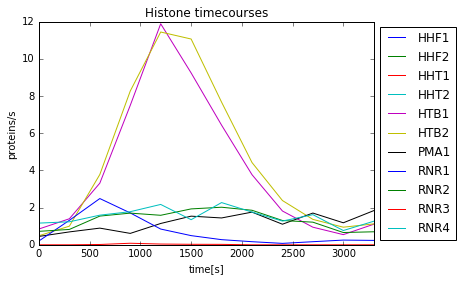

In [72]:
pl = translation_ratedf.plot(title="Histone timecourses")

pl.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
pl.set_xlabel("time[s]")
pl.set_ylabel("proteins/s")

In [73]:
translation_ratedf

,HHF1,HHF2,HHT1,HHT2,HTB1,HTB2,PMA1,RNR1,RNR2,RNR3,RNR4
0,0.0,0.0,0.0,0.0,0.850000,0.486667,0.450000,0.206667,0.723333,0.000000,1.166667
300,0.0,0.0,0.0,0.0,1.400000,1.003333,0.693333,1.316667,0.826667,0.000000,1.236667
600,0.0,0.0,0.0,0.0,3.313333,3.780000,0.896667,2.486667,1.543333,0.016667,1.593333
900,0.0,0.0,0.0,0.0,7.496667,8.266667,0.613333,1.713333,1.703333,0.083333,1.780000
1200,0.0,0.0,0.0,0.0,11.883333,11.440000,1.146667,0.846667,1.586667,0.040000,2.170000
1500,0.0,0.0,0.0,0.0,9.240000,11.063333,1.540000,0.493333,1.930000,0.026667,1.350000
1800,0.0,0.0,0.0,0.0,6.433333,7.670000,1.443333,0.276667,2.020000,0.023333,2.270000
2100,0.0,0.0,0.0,0.0,3.770000,4.423333,1.756667,0.166667,1.856667,0.000000,1.760000
2400,0.0,0.0,0.0,0.0,1.816667,2.380000,1.106667,0.076667,1.306667,0.000000,1.276667
2700,0.0,0.0,0.0,0.0,0.946667,1.366667,1.706667,0.166667,1.216667,0.000000,1.620000


In [74]:
transcriptome_df = pd.DataFrame(transcriptomes_dict).transpose()
del transcriptome_df[0]
transcriptome_df.index = np.arange(0, 3601, 300)
transcriptome_df

,Q0010,Q0017,Q0032,Q0045,Q0050,Q0055,Q0060,Q0065,Q0070,Q0075,...,YPR196W,YPR197C,YPR198W,YPR199C,YPR200C,YPR201W,YPR202W,YPR203W,YPR204C-A,YPR204W
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
300,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
600,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
900,0,0,0,0,0,0,0,0,0,0,...,0,0,2,1,0,0,0,0,0,0
1200,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,0,0,0,0
1500,0,0,0,0,0,0,0,0,0,0,...,1,0,2,1,0,0,0,0,0,0
1800,0,0,0,0,0,0,0,0,0,0,...,0,0,2,2,0,0,0,0,0,0
2100,0,0,0,0,0,0,0,0,0,0,...,0,0,2,1,0,0,0,0,0,0
2400,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
2700,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0


In [75]:
transcriptome_df_short = transcriptome_df[transcriptome_df.index<3600][genes_shortlist.values()]

In [76]:
transcriptome_df_short.columns = genes_shortlist.keys()
transcriptome_df_short

,HTB2,HTB1,HHF1,HHF2,PMA1,RNR2,RNR3,HHT2,RNR1,RNR4,HHT1
0,2,3,2,6,3,4,0,7,2,6,2
300,4,5,1,7,4,5,0,11,11,6,2
600,27,18,10,50,10,16,1,55,46,15,12
900,58,41,55,77,6,18,2,97,29,15,42
1200,77,65,106,107,11,16,1,119,14,19,70
1500,113,68,152,152,24,30,1,232,12,17,81
1800,75,48,91,81,22,29,1,141,6,29,40
2100,44,28,47,46,28,27,0,81,5,23,23
2400,12,8,8,15,8,10,0,20,1,8,4
2700,7,4,6,9,12,9,0,11,2,10,3


In [77]:
translation_rate_per_mrna = translation_ratedf/transcriptome_df_short

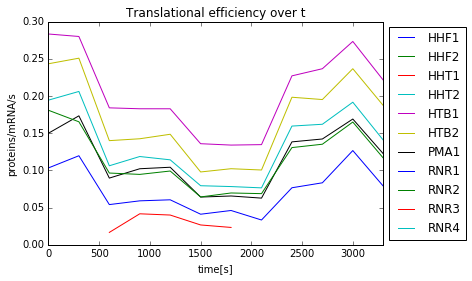

In [78]:
pl = translation_rate_per_mrna.plot(title="Translational efficiency over t")
pl.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
pl.set_xlabel("time[s]")
pl.set_ylabel("proteins/mRNA/s")

Translation efficiency goes down in late G1 phase (at 1500 s)

In [79]:
translation_rate_per_mrna

,HHF1,HHF2,HHT1,HHT2,HTB1,HTB2,PMA1,RNR1,RNR2,RNR3,RNR4
0,0.0,0.0,0.0,0.0,0.283333,0.243333,0.150000,0.103333,0.180833,NaN,0.194444
300,0.0,0.0,0.0,0.0,0.280000,0.250833,0.173333,0.119697,0.165333,NaN,0.206111
600,0.0,0.0,0.0,0.0,0.184074,0.140000,0.089667,0.054058,0.096458,0.016667,0.106222
900,0.0,0.0,0.0,0.0,0.182846,0.142529,0.102222,0.059080,0.094630,0.041667,0.118667
1200,0.0,0.0,0.0,0.0,0.182821,0.148571,0.104242,0.060476,0.099167,0.040000,0.114211
1500,0.0,0.0,0.0,0.0,0.135882,0.097906,0.064167,0.041111,0.064333,0.026667,0.079412
1800,0.0,0.0,0.0,0.0,0.134028,0.102267,0.065606,0.046111,0.069655,0.023333,0.078276
2100,0.0,0.0,0.0,0.0,0.134643,0.100530,0.062738,0.033333,0.068765,NaN,0.076522
2400,0.0,0.0,0.0,0.0,0.227083,0.198333,0.138333,0.076667,0.130667,NaN,0.159583
2700,0.0,0.0,0.0,0.0,0.236667,0.195238,0.142222,0.083333,0.135185,NaN,0.162000


In [80]:
translation_rate_per_mrna.to_csv('translation_rate_per_mrna.csv')

Comparison with initiation probabilities: translation_rate_per_mrna

In [82]:
init_rates = pkl.load(open("../../parameters/init_rates_enhanced_median.p", "rb"))
init_rates_common = {gene: init_rates[genes_shortlist[gene]]*1e6 for gene in genes_shortlist}

11


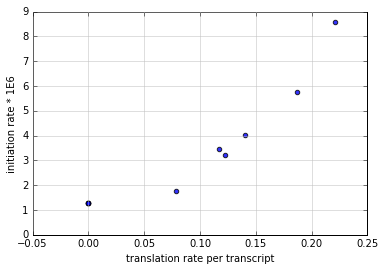

In [89]:
scatter_dicts(dict(translation_rate_per_mrna.ix[3300]), init_rates_common, xaxislabel="translation rate per transcript", 
              yaxislabel="initiation rate * 1E6", lws=False, logx=False, logy=False, alpha=0.8)
#plt.set_xlabel("test")

Translation rate is practically proportional to initiation rate.

In [90]:
init_rates_common

{'HHF1': 1.291871859830537,
 'HHF2': 1.291871859830537,
 'HHT1': 1.291871859830537,
 'HHT2': 1.291871859830537,
 'HTB1': 8.580451211929118,
 'HTB2': 5.738927640019162,
 'PMA1': 3.2253823872000513,
 'RNR1': 1.7477148350729443,
 'RNR2': 3.4541884421416924,
 'RNR3': 1.1468920259159536,
 'RNR4': 4.039182074735152}

## 6. Translational efficiency over time (like 5, but at genome-scale)

In [91]:
translation_rate_shortlist = {}
genes = transcriptomes_dict[0].keys()[1:]

for gene in genes:
    translation_rate_shortlist[gene] = []
    for time in np.arange(0, 3600, 300):
        if gene in results[time]['timecourses']:
            rate = float(results[time]['timecourses'][gene][-1]-results[time]['timecourses'][gene][-301])/300.
        else:
            rate = 0.
        translation_rate_shortlist[gene].append(rate)

translation_ratedf = pd.DataFrame(translation_rate_shortlist, index=np.arange(0, 3600, 300))

Translatome:

In [92]:
translation_ratedf

,Q0010,Q0017,Q0032,Q0045,Q0050,Q0055,Q0060,Q0065,Q0070,Q0075,...,YPR196W,YPR197C,YPR198W,YPR199C,YPR200C,YPR201W,YPR202W,YPR203W,YPR204C-A,YPR204W
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
300,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.036667,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
900,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.100000,0.023333,0.0,0.0,0.0,0.0,0.0,0.0
1200,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.060000,0.020000,0.0,0.0,0.0,0.0,0.0,0.0
1500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.073333,0.010000,0.0,0.0,0.0,0.0,0.0,0.0
1800,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.053333,0.026667,0.0,0.0,0.0,0.0,0.0,0.0
2100,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.046667,0.020000,0.0,0.0,0.0,0.0,0.0,0.0
2400,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.086667,0.020000,0.0,0.0,0.0,0.0,0.0,0.0
2700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.070000,0.016667,0.0,0.0,0.0,0.0,0.0,0.0


Is the first row identically zero?

In [93]:
translation_ratedf.ix[0].describe()

count    6650.000000
mean        0.222477
std         1.238524
min         0.000000
25%         0.000000
50%         0.000000
75%         0.110000
max        36.623333
Name: 0, dtype: float64

No it isn't. (Because the 0 refers to the interval [0 s, 300 s] etc.)

Transcriptome:

In [94]:
transcriptome_df = pd.DataFrame(transcriptomes_dict).transpose()
del transcriptome_df[0]
transcriptome_df.index = np.arange(0, 3601, 300)
transcriptome_df

,Q0010,Q0017,Q0032,Q0045,Q0050,Q0055,Q0060,Q0065,Q0070,Q0075,...,YPR196W,YPR197C,YPR198W,YPR199C,YPR200C,YPR201W,YPR202W,YPR203W,YPR204C-A,YPR204W
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
300,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
600,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
900,0,0,0,0,0,0,0,0,0,0,...,0,0,2,1,0,0,0,0,0,0
1200,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,0,0,0,0
1500,0,0,0,0,0,0,0,0,0,0,...,1,0,2,1,0,0,0,0,0,0
1800,0,0,0,0,0,0,0,0,0,0,...,0,0,2,2,0,0,0,0,0,0
2100,0,0,0,0,0,0,0,0,0,0,...,0,0,2,1,0,0,0,0,0,0
2400,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
2700,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0


Divide one by the other to get the translational efficiency per mRNA:

In [95]:
translation_rate_per_mrna = translation_ratedf/transcriptome_df
translation_rate_per_mrna

,Q0010,Q0017,Q0032,Q0045,Q0050,Q0055,Q0060,Q0065,Q0070,Q0075,...,YPR196W,YPR197C,YPR198W,YPR199C,YPR200C,YPR201W,YPR202W,YPR203W,YPR204C-A,YPR204W
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.036667,NaN,0.0,NaN,NaN,NaN,NaN,NaN
900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.050000,0.023333,NaN,NaN,NaN,NaN,NaN,NaN
1200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.060000,0.020000,0.0,NaN,NaN,NaN,NaN,NaN
1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,0.036667,0.010000,NaN,NaN,NaN,NaN,NaN,NaN
1800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.026667,0.013333,NaN,NaN,NaN,NaN,NaN,NaN
2100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.023333,0.020000,NaN,NaN,NaN,NaN,NaN,NaN
2400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.086667,0.020000,NaN,NaN,NaN,NaN,NaN,NaN
2700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.070000,0.016667,NaN,NaN,NaN,NaN,NaN,NaN


In [96]:
translation_rate_per_mrna.dropna(axis=1, how='all', inplace=True)

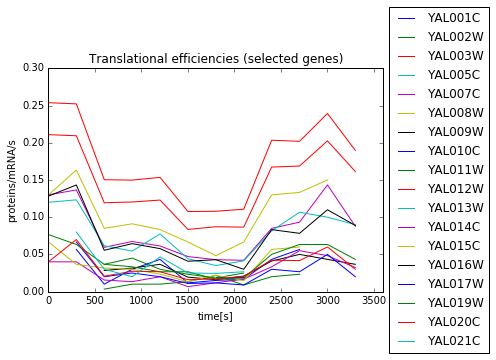

In [97]:
pl = translation_rate_per_mrna.ix[:, :18].plot(title="Translational efficiencies (selected genes)")
pl.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
pl.set_xlabel("time[s]")
pl.set_ylabel("proteins/mRNA/s")
#pl.set_yscale("log")

The suppressed translation efficiency is not just limited to histones.

In [98]:
translation_rate_per_mrna

,YAL001C,YAL002W,YAL003W,YAL005C,YAL007C,YAL008W,YAL009W,YAL010C,YAL011W,YAL012W,...,YPR187W,YPR188C,YPR189W,YPR190C,YPR191W,YPR192W,YPR196W,YPR198W,YPR199C,YPR200C
0,NaN,0.056667,0.253922,0.0,0.130000,0.130000,0.060000,NaN,NaN,0.210952,...,0.143333,0.113333,0.076667,0.076667,0.113333,NaN,NaN,NaN,NaN,NaN
300,0.056667,NaN,0.252308,0.0,0.136667,0.163333,NaN,NaN,NaN,0.209474,...,0.154167,0.120000,0.066667,0.076667,0.130000,NaN,NaN,NaN,NaN,NaN
600,0.010000,0.003333,0.150347,0.0,0.059444,0.085000,0.028333,NaN,0.036667,0.119436,...,0.070256,0.055000,0.035000,0.036667,0.048333,NaN,NaN,0.036667,NaN,0.0
900,0.030000,0.010000,0.149869,0.0,0.067333,0.091111,0.031667,0.023333,0.045000,0.120437,...,0.075897,0.053333,0.048333,0.040000,0.060000,NaN,NaN,0.050000,0.023333,NaN
1200,0.043333,0.010000,0.153529,0.0,0.061333,0.083333,0.036667,NaN,0.030000,0.123030,...,0.076000,0.065556,0.056667,0.045333,0.060000,NaN,NaN,0.060000,0.020000,0.0
1500,0.011667,0.013333,0.107633,0.0,0.047083,0.066667,0.019444,NaN,0.023333,0.083539,...,0.042857,0.040000,0.024167,0.028889,0.047778,0.0,0.0,0.036667,0.010000,NaN
1800,0.015000,0.021667,0.107967,0.0,0.042917,0.048333,0.016000,0.020000,0.018333,0.087174,...,0.052963,0.031111,0.025833,0.028889,0.050000,NaN,NaN,0.026667,0.013333,NaN
2100,0.016667,0.008889,0.110769,0.0,0.042083,0.066667,0.020833,0.020000,0.025000,0.086667,...,0.053175,0.035556,0.025000,0.020476,0.043333,NaN,NaN,0.023333,0.020000,NaN
2400,0.043333,0.020000,0.203457,0.0,0.085000,0.130000,0.041111,NaN,NaN,0.167374,...,0.105455,0.086667,0.058333,0.070000,0.093333,NaN,NaN,0.086667,0.020000,NaN
2700,0.056667,0.023333,0.201986,0.0,0.093333,0.133333,0.050000,NaN,0.070000,0.168780,...,0.110303,0.088333,0.063333,0.055000,0.091667,NaN,NaN,0.070000,0.016667,NaN


In [99]:
translation_rate_per_mrna.mean(axis=1, skipna=True)

0       0.093837
300     0.095032
600     0.040945
900     0.042350
1200    0.043535
1500    0.027455
1800    0.027322
2100    0.027900
2400    0.066524
2700    0.066169
3000    0.089720
3300    0.062464
3600         NaN
dtype: float64

(0, 0.12)

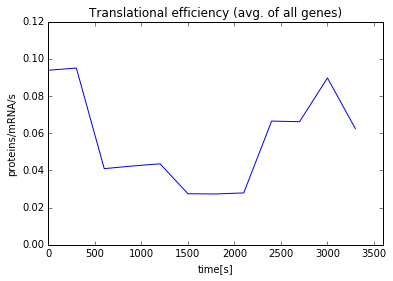

In [100]:
pl = translation_rate_per_mrna.mean(axis=1, skipna=True).plot(title="Translational efficiency (avg. of all genes)")
pl.set_xlabel("time[s]")
pl.set_ylabel("proteins/mRNA/s")
plt.ylim([0, 0.12])

Confirms the hypothesis that something is limiting during S phase.

## 7. Translational efficiency by initiation probability

Now we want to explode the previous graph by initiation probability.

Load unadjusted initiation probabilites:

In [101]:
init_rates = pkl.load(open("../../parameters/init_rates_plotkin.p", "rb"))

Frequency distribution of initiation rates:

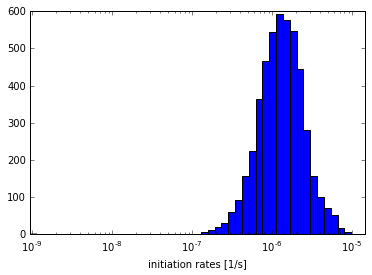

In [102]:
plt.hist(init_rates.values(), bins = 10**np.linspace(np.log10(min(init_rates.values())), 
                                                              np.log10(max(init_rates.values())), num=50))
plt.gca().set_xscale("log")
plt.gca().set_xlim([min(init_rates.values()), max(init_rates.values())])
plt.gca().set_xlabel('initiation rates [1/s]')
plt.show()

Define translation rate as the average number of proteins produced per second over a 300 s interval:

In [103]:
translation_rate = {}

for gene in init_rates:
    translation_rate[gene] = []
    for time in np.arange(0, 3600, 300):
        if gene in results[time]['timecourses']:
            rate = float(results[time]['timecourses'][gene][-1]-results[time]['timecourses'][gene][-301])/300.
        else:
            rate = 0.
        translation_rate[gene].append(rate)

Convert to data frame:

In [104]:
translation_rate_df = pd.DataFrame(translation_rate)
translation_rate_df.index = np.arange(0, 3600, 300)
translation_rate_df['time'] = translation_rate_df.index
translation_rate_df

,YAL001C,YAL002W,YAL003W,YAL007C,YAL008W,YAL009W,YAL010C,YAL011W,YAL012W,YAL013W,...,YPR185W,YPR186C,YPR187W,YPR188C,YPR189W,YPR190C,YPR191W,YPR198W,YPR199C,time
0,0.000000,0.056667,4.316667,0.130000,0.130000,0.060000,0.000000,0.000000,4.430000,0.120000,...,0.000000,0.000000,0.716667,0.113333,0.076667,0.076667,0.113333,0.000000,0.000000,0
300,0.056667,0.000000,3.280000,0.136667,0.163333,0.000000,0.000000,0.000000,3.980000,0.123333,...,0.050000,0.000000,0.616667,0.120000,0.066667,0.076667,0.130000,0.000000,0.000000,300
600,0.010000,0.003333,7.216667,0.356667,0.340000,0.056667,0.000000,0.036667,7.763333,0.123333,...,0.053333,0.026667,0.913333,0.110000,0.070000,0.073333,0.096667,0.036667,0.000000,600
900,0.030000,0.010000,7.643333,0.336667,0.273333,0.063333,0.023333,0.090000,7.346667,0.163333,...,0.020000,0.033333,0.986667,0.266667,0.096667,0.080000,0.060000,0.100000,0.023333,900
1200,0.043333,0.010000,7.830000,0.306667,0.166667,0.073333,0.000000,0.030000,6.766667,0.310000,...,0.020000,0.050000,1.140000,0.196667,0.056667,0.226667,0.120000,0.060000,0.020000,1200
1500,0.023333,0.026667,10.763333,0.376667,0.266667,0.116667,0.000000,0.023333,6.766667,0.176667,...,0.033333,0.100000,0.900000,0.160000,0.096667,0.086667,0.143333,0.073333,0.010000,1500
1800,0.030000,0.043333,10.796667,0.343333,0.096667,0.080000,0.020000,0.036667,8.020000,0.140000,...,0.016667,0.040000,0.953333,0.093333,0.103333,0.086667,0.100000,0.053333,0.026667,1800
2100,0.016667,0.026667,11.520000,0.336667,0.133333,0.083333,0.020000,0.050000,7.800000,0.206667,...,0.020000,0.016667,1.116667,0.106667,0.100000,0.143333,0.130000,0.046667,0.020000,2100
2400,0.043333,0.020000,5.493333,0.170000,0.130000,0.123333,0.000000,0.000000,5.523333,0.163333,...,0.000000,0.043333,1.160000,0.086667,0.116667,0.070000,0.093333,0.086667,0.020000,2400
2700,0.056667,0.023333,9.493333,0.093333,0.133333,0.050000,0.000000,0.070000,6.920000,0.106667,...,0.046667,0.000000,1.213333,0.176667,0.063333,0.110000,0.183333,0.070000,0.016667,2700


Convert initiation rates to data frame:

In [105]:
init_rates_df = pd.DataFrame.from_dict(init_rates, orient='index')
init_rates_df.columns = ['init_rates']
init_rates_df['init_rates'] *= 1000000

Define exponential bins for bucketing:

In [106]:
bins = 10**np.linspace(np.log10(min(init_rates_df['init_rates'])), np.log10(max(init_rates_df['init_rates'])), num=20)
bins

array([  9.37576635e-04,   1.55722534e-03,   2.58640273e-03,
         4.29576818e-03,   7.13486112e-03,   1.18503236e-02,
         1.96822570e-02,   3.26903511e-02,   5.42955544e-02,
         9.01797358e-02,   1.49779938e-01,   2.48770187e-01,
         4.13183547e-01,   6.86258453e-01,   1.13980982e+00,
         1.89311537e+00,   3.14428401e+00,   5.22235577e+00,
         8.67383470e+00,   1.44064119e+01])

In [107]:
translation_rate_df_long = pd.merge(init_rates_df, pd.melt(translation_rate_df, id_vars=['time']), 
                                    left_index=True, right_on='variable')

58068


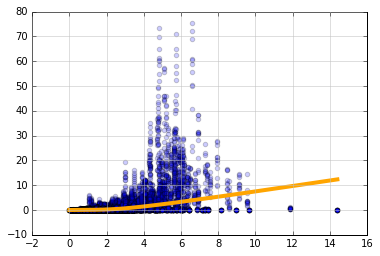

In [108]:
scatter_dicts(translation_rate_df_long['init_rates'].to_dict(), translation_rate_df_long['value'].to_dict(), 
              logx=False, logy=False)

Not interesting.

Cut data frame into bins:

In [109]:
translation_rate_df_long['bin'] = pd.cut(translation_rate_df_long.init_rates, bins)
translation_rate_df_long.head()

,init_rates,time,variable,value,bin
3564,1.644214,0,YBR177C,0.136667,"(1.14, 1.893]"
3565,1.644214,300,YBR177C,0.130000,"(1.14, 1.893]"
3566,1.644214,600,YBR177C,0.000000,"(1.14, 1.893]"
3567,1.644214,900,YBR177C,0.100000,"(1.14, 1.893]"
3568,1.644214,1200,YBR177C,0.093333,"(1.14, 1.893]"


In [110]:
translation_rate_df_long_grouped = translation_rate_df_long.groupby(['bin', 'time'])
translation_rate_df_long_averaged = translation_rate_df_long_grouped.mean()

Remember this is a hierarchical column index:

In [111]:
translation_rate_by_IP_by_time = translation_rate_df_long_averaged.unstack()['value']

In [112]:
xpos = np.arange(translation_rate_by_IP_by_time.shape[0])
ypos = np.arange(translation_rate_by_IP_by_time.shape[1])
yposM, xposM = np.meshgrid(ypos + 0.5, xpos + 0.5)
zpos = np.zeros(translation_rate_by_IP_by_time.shape).flatten()

In [113]:
dx = 0.5 * np.ones_like(zpos)
dy = 0.1 * np.ones_like(zpos)
dz = translation_rate_by_IP_by_time.values.ravel()

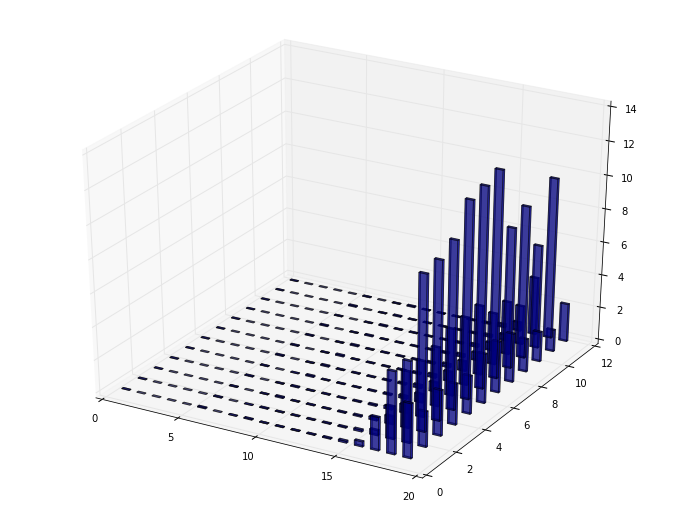

In [114]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

#values = np.linspace(0.2, 1., xposM.ravel().shape[0])
#colors = cm.rainbow(values)

ax.bar3d(xposM.ravel(), yposM.ravel(), zpos, dx, dy, dz, #color=colors, 
         alpha=0.5)

Too ugly. We try a (first: linear) heatmap instead.

/usr/lib/python2.7/dist-packages/matplotlib/colors.py:581: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


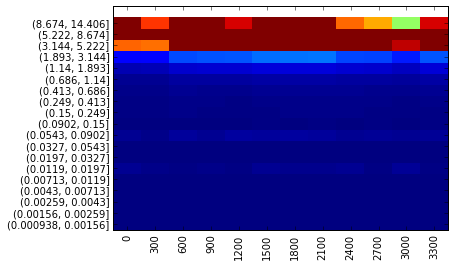

In [115]:
df = translation_rate_by_IP_by_time

plt.pcolor(df, vmin=0, vmax=2.5)
# set the limits of the plot to the limits of the data
#plt.axis([x.min(), x.max(), y.min(), y.max()])
plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation='vertical')
plt.show()

Logarithmic heatmap:

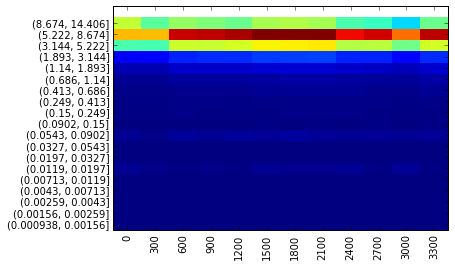

In [116]:
df = np.log(1+translation_rate_by_IP_by_time)

plt.pcolor(df, vmin=0, vmax=2.5)
# set the limits of the plot to the limits of the data
#plt.axis([x.min(), x.max(), y.min(), y.max()])
plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation='vertical')
plt.show()

Try again with non-exponential bins:

In [117]:
bins = np.linspace(min(init_rates_df['init_rates']), max(init_rates_df['init_rates']), num=20)
bins

array([  9.37576635e-04,   7.59120437e-01,   1.51730330e+00,
         2.27548616e+00,   3.03366902e+00,   3.79185188e+00,
         4.55003474e+00,   5.30821760e+00,   6.06640046e+00,
         6.82458332e+00,   7.58276618e+00,   8.34094904e+00,
         9.09913190e+00,   9.85731476e+00,   1.06154976e+01,
         1.13736805e+01,   1.21318633e+01,   1.28900462e+01,
         1.36482291e+01,   1.44064119e+01])

In [118]:
translation_rate_df_long['bin'] = pd.cut(translation_rate_df_long.init_rates, bins)
translation_rate_df_long.head()

,init_rates,time,variable,value,bin
3564,1.644214,0,YBR177C,0.136667,"(1.517, 2.275]"
3565,1.644214,300,YBR177C,0.130000,"(1.517, 2.275]"
3566,1.644214,600,YBR177C,0.000000,"(1.517, 2.275]"
3567,1.644214,900,YBR177C,0.100000,"(1.517, 2.275]"
3568,1.644214,1200,YBR177C,0.093333,"(1.517, 2.275]"


In [119]:
translation_rate_df_long_grouped = translation_rate_df_long.groupby(['bin', 'time'])
translation_rate_df_long_averaged = translation_rate_df_long_grouped.mean()

In [120]:
translation_rate_by_IP_by_time = translation_rate_df_long_averaged.unstack()['value']

In [121]:
xpos = np.arange(translation_rate_by_IP_by_time.shape[0])
ypos = np.arange(translation_rate_by_IP_by_time.shape[1])
yposM, xposM = np.meshgrid(ypos + 0.5, xpos + 0.5)
zpos = np.zeros(translation_rate_by_IP_by_time.shape).flatten()

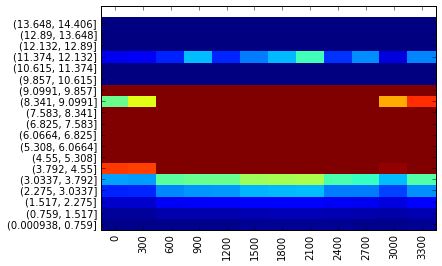

In [122]:
df = translation_rate_by_IP_by_time

plt.pcolor(df, vmin=0, vmax=2.5)
# set the limits of the plot to the limits of the data
#plt.axis([x.min(), x.max(), y.min(), y.max()])
plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation='vertical')
plt.show()

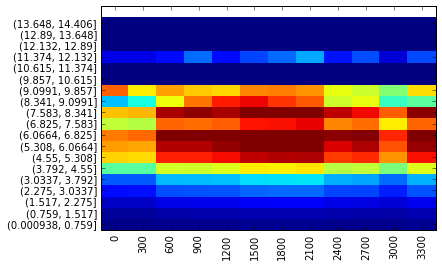

In [123]:
df = np.log(1+translation_rate_by_IP_by_time)

plt.pcolor(df, vmin=0, vmax=2.5)
# set the limits of the plot to the limits of the data
#plt.axis([x.min(), x.max(), y.min(), y.max()])
plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation='vertical')
plt.show()